# Homework \#10

Face Tracking with KLT



## Import Modules

In [10]:
# the following two lines solved the issue of video crashing for MacOS
# you may not need those, depending on you OS
import matplotlib
matplotlib.use("TKAgg")

import numpy as np
import cv2
import matplotlib.pyplot as plt
import math
import scipy.signal
import scipy.linalg
import mae6292.tools as mae6292
import importlib

from mae6292.imshow import cv2_imshow

## Problem 1

We will perform face tracking using [https://github.com/intel-iot-devkit/sample-videos](https://github.com/intel-iot-devkit/sample-videos)

### (a) Select Keypoints

1. Using 
```
    mae6292.harris_corner()
    mae6292.select_keypoints()
```
select the keypoints of `frame0` with the parameters
```
W_harris_patch = 4
harris_kappa = 0.08
W_nms = 8
N_keypoints = 1000
```

2. Convert the identififed keypoints to `2 by n` array by

```
p = np.array(keypoints, dtype='float32').T # conver list to np.array
p = p[[1,0],:] # swap row and col

```

3. Show the keypoints on `frame0` using the variable `p`

The results of this part will be similar with
<img src="prob1a_sol.png" width="500"/>

Save it into `prob1a.png`

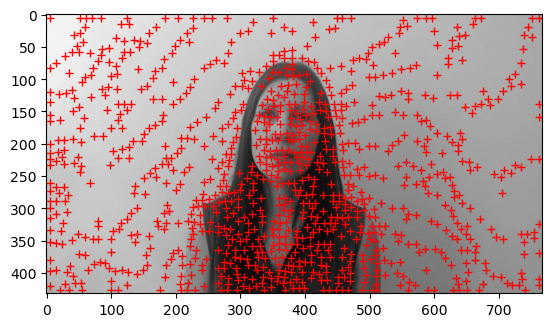

In [11]:
%matplotlib inline

frame0 = cv2.imread('data/face000000.png',cv2.IMREAD_GRAYSCALE)

W_harris_patch = 4
harris_kappa = 0.08
W_nms = 8
N_keypoints = 1000

# compute harris_score
harris_score = mae6292.harris_corner(frame0, W_harris_patch, harris_kappa)

# select key points
keypoints = mae6292.select_keypoints(harris_score, N_keypoints, W_nms)

# Convert list to np.array and swap rows and columns
p = np.array(keypoints, dtype='float32').T # conver list to np.array
p = p[[1,0],:] # swap row and co

# Plotting
plt.figure(dpi=100)
plt.imshow(frame0, cmap='gray')
plt.plot(p[0,:], p[1,:], 'r+')

#Saving the image
plt.savefig('prob1a.png')


### (b) Select Keypoints for Face

1. The following function draw a yellow rectangle from the upper left corner `(u0,v0)` to the lower right corner `(u1,v1)`
```
def rectangle(u0, v0, u1, v1):
    plt.plot([u0, u1],[v0, v0],'y')
    plt.plot([u0, u1],[v1, v1],'y')
    plt.plot([u0, u0],[v0, v1],'y')
    plt.plot([u1, u1],[v0, v1],'y')
```
Adjust the value of `(u0,v0),(u1,v1)` so that the rectangle encloses the face.

2. Identify the keypoints within the about rectangle, and save it into `p0_face`. 

3. Show the bounding box for the face and the features in the box.

The results of this part will be similar with

<img src="prob1b_sol.png" width="500"/>

Save it into `prob1b.png`

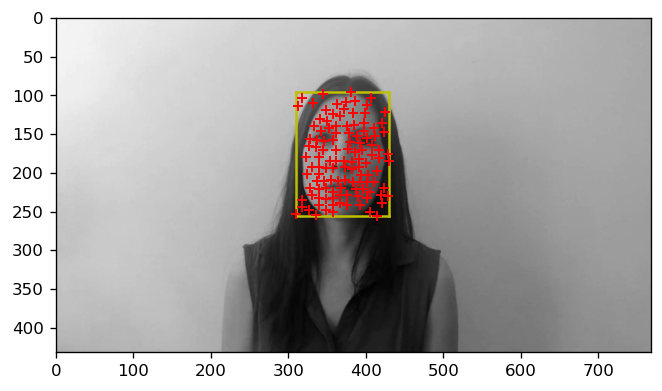

In [12]:
def rectangle(u0, v0, u1, v1):
    plt.plot([u0, u1],[v0, v0],'y')
    plt.plot([u0, u1],[v1, v1],'y')
    plt.plot([u0, u0],[v0, v1],'y')
    plt.plot([u1, u1],[v0, v1],'y')

# rectangle size (values)    
u0, v0 = 310, 95
u1, v1 = 430, 255

# 2. Identify keypoints in the box

# empty container
p0_face = np.empty((2,0), dtype='float32')
# repeat for each keypoint
for i in range(p.shape[1]):
    ## YOUR CODE HERE:
    ## write if statement for the case that the i-th keypoint (p[0,i], p[1,i]) belongs to the box
    # Iterate through each keypoint
    if u0 <= p[0, i] <= u1 and v0 <= p[1, i] <= v1:
        p0_face = np.append(p0_face, p[:, i].reshape(2, 1), axis=1)
        p0_face = np.append(p0_face, p[:,i].reshape(2,1), axis=1)

# 3. Plot box and feaatures, adjust (u0,v0), (u1,v1) manually        
plt.figure(dpi=120)
plt.imshow(frame0, cmap='gray')
rectangle(u0,v0, u1,v1)
plt.plot(p0_face[0,:], p0_face[1,:], 'r+')

plt.savefig('prob1b.png')


## Problem 2

### (a)

Now, we are going to track the features within the bounding box, using KLT. 

1. Load `frame1`.
2. Tack the above face features `p0_face` from `frame0` and `frame` using

```
p1, index_track = mae6292.KLT(frame0, frame1, p0_face, W = 7, tol_bidir = 10, display = False)
p1_face = p1[:,index_track]

```

3. Determine `(u0,v0), (u1,v1)` for the new bounding box enclosing `p1_face`. For example
```
u0 = np.amin(p1_face[0,:])
```
4. Show the new bounding box for the face and the features in `frame1`


The results of this part will be similar with
<img src="prob2a_sol.png" width="500"/>

Save it into `prob2a.png`






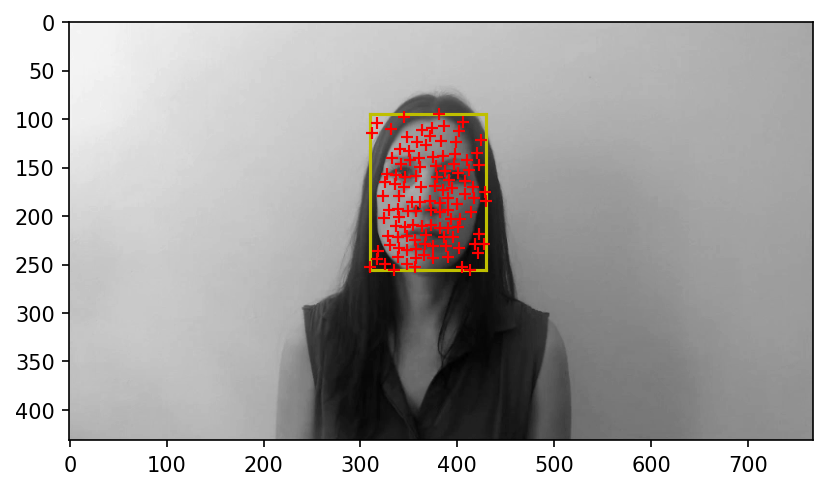

In [13]:
# Load frame1 and read it in grayscale
frame1 = cv2.imread('data/face000001.png',cv2.IMREAD_GRAYSCALE)

# Track points from frame0 to frame1 using KLT algorithm
p1, index_track = mae6292.KLT(frame0, frame1, p0_face, W = 7, tol_bidir = 10, display = False)

# Filter points by index_track
p1_face = p1[:,index_track]

# Find the minimum and maximum coordinates to define the rectangle
u0 = np.amin(p1_face[0, :])  # Minimum x
v0 = np.amin(p1_face[1, :])  # Minimum y
u1 = np.amax(p1_face[0, :])  # Maximum x
v1 = np.amax(p1_face[1, :])  # Maximum y

# Plotting the frame and points
plt.figure(dpi=150)
plt.imshow(frame0, cmap='gray')
rectangle(u0,v0, u1,v1)

# Plot the points on the image
plt.plot(p1_face[0,:], p1_face[1,:], 'r+')

# Save the figure
plt.savefig('prob2a.png')

### (b)

Repeat the above tracking up to the first 100 frames. The last plot will be similar with


<img src="prob2b_sol.png" width="500"/>


Save the last plot as `prob2b.png`


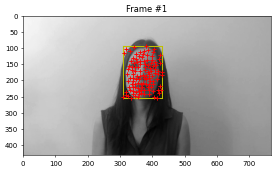

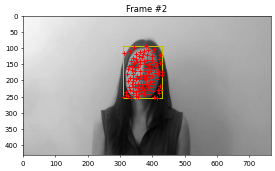

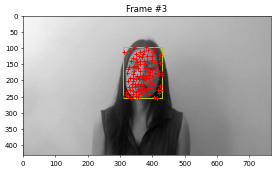

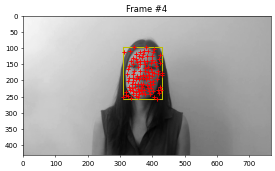

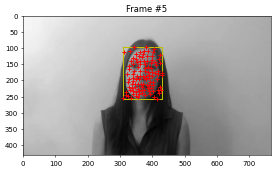

...

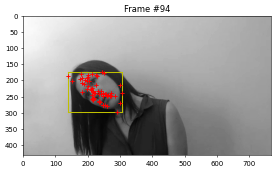

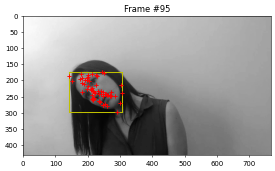

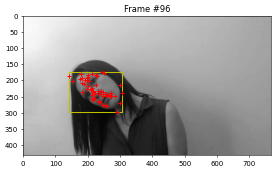

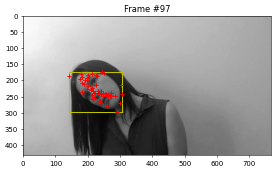

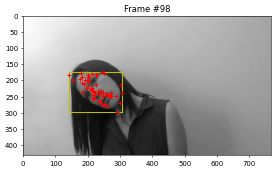

In [14]:
# draw figures within jupyter
%matplotlib inline

frame_pre = frame0
p_face_pre = p0_face
    
for i in range(1,100):
    frame = cv2.imread("data/face{:06d}.png".format(i),cv2.IMREAD_GRAYSCALE)

    # Track `p_face_pre` from frame_pre to frame
    p_face, index_track = mae6292.KLT(frame_pre, frame, p_face_pre, W=7, tol_bidir=10, display=False)
    
    # Filter points by index_track
    p_face = p_face[:, index_track]  
    
    # choose (u0, v0), (u1, v1)
    if p_face.size > 0:
        u0 = np.amin(p_face[0, :])
        v0 = np.amin(p_face[1, :])
        u1 = np.amax(p_face[0, :])
        v1 = np.amax(p_face[1, :])
        
        # show results
        plt.figure(dpi=50)
        plt.imshow(frame, cmap='gray')
        rectangle(u0,v0, u1,v1)
        plt.plot(p_face[0,:], p_face[1,:], 'r+')
        p_face_pre = p_face
        frame_pre = frame
        
    # Saving the 99th frame
    if i == 99:
        # Set the title to include the frame number
        plt.title(f'Frame #{i}')
        
         # Save the frame as 'prob2b.png'
        plt.savefig('prob2b.png')
        
        # Close the figure to free up memory
        plt.close()  
    else:
        # Set the title to include the frame number
        plt.title(f'Frame #{i}')  
        plt.show()
        
# Increment the frame counter after displaying each frame
i += 1 
    

### (c)

Here we will read and save videos using OpenCV. Read the tutorial [Getting Started with Videos](https://docs.opencv.org/master/dd/d43/tutorial_py_video_display.html). 

The following code will 
1. read the each frame of the video
2. draw an arbitrary box
3. display each frame
4. save the video into `prob2c.mp4`

Modify codes within the lines closed by `#####` such that the results of 2.(b) is saved into a video file, `prob2c.mp4`


In [15]:
# open a new window for plot
%matplotlib tk

# open a video file to read
video_read = cv2.VideoCapture('head-pose-face-detection-female.mp4')

# get frame size and fps (number of frames per second)
width = int(video_read.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(video_read.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = video_read.get(cv2.CAP_PROP_FPS)
size = (width, height)

# open a video file to save
codec = cv2.VideoWriter_fourcc(*'mp4v')
video_save = cv2.VideoWriter('prob2c.mp4', codec, fps, size)

# to initiate the iteration, the first frame is saved to `frame_pre`
ret, frame_color = video_read.read() # color frame
frame_pre = cv2.cvtColor(frame_color, cv2.COLOR_BGR2GRAY) # grayscale frame
p_face_pre = p0_face # face features for the first frame

# repeat for each frame
for i in range(1,300):    

    # read a new frame
    ret, frame_color = video_read.read() # color frame
    print("frame number ", i)
    frame = cv2.cvtColor(frame_color, cv2.COLOR_BGR2GRAY) #grayscale frame
    if not ret:
        break
        
    frame = cv2.cvtColor(frame_color, cv2.COLOR_BGR2GRAY)  # grayscale frame
    
    # 1. Track p_face_pre from frame_pre to frame, save the tracked frame into p_face
    p_face, index_track = mae6292.KLT(frame_pre, frame, p_face_pre, W=7, tol_bidir=10, display=False)
    
    # Filter points by index_track
    p_face = p_face[:, index_track] 
    
    u0, v0 = 350, 325
    u1, v1 = 500, 75
    
    # 2. Compute (u0,v0), (u1,v1) for the new bounding box using p_face
    if p_face.size > 0:
        u0 = np.amin(p_face[0, :])
        v0 = np.amin(p_face[1, :])
        u1 = np.amax(p_face[0, :])
        v1 = np.amax(p_face[1, :])
    
    # 3. Draw a rectangle on the color frame
    cv2.rectangle(frame_color, (int(u0),int(v0)), (int(u1),int(v1)), (0, 255,255))     
    
    # 4. current frame and features are saved into pre-frame and pre-feataures, for the next iteration
    frame_pre = frame
    p_face_pre = p_face
      
    # save the frame
    video_save.write(frame_color)

# release video files       
video_read.release()
video_save.release()
cv2.destroyAllWindows()


frame number  1
frame number  2
frame number  3
frame number  4
frame number  5
frame number  6
frame number  7
frame number  8
frame number  9
frame number  10
frame number  11
frame number  12
frame number  13
frame number  14
frame number  15
frame number  16
frame number  17
frame number  18
frame number  19
frame number  20
frame number  21
frame number  22
frame number  23
frame number  24
frame number  25
frame number  26
frame number  27
frame number  28
frame number  29
frame number  30
frame number  31
frame number  32
frame number  33
frame number  34
frame number  35
frame number  36
frame number  37
frame number  38
frame number  39
frame number  40
frame number  41
frame number  42
frame number  43
frame number  44
frame number  45
frame number  46
frame number  47
frame number  48
frame number  49
frame number  50
frame number  51
frame number  52
frame number  53
frame number  54
frame number  55
frame number  56
frame number  57
frame number  58
frame number  59
frame 

## Problem 3

Record a short video of yourself and perform face tracking using the above code. Save it into `prob3.mp4`

1. Your video can be about 5 seconds or so.
2. Try to reduce the resolution. For example, the resolution of the above video is `(768, 432)`
3. You may need to tune the following parameters for Harris feature detector
```
W_harris_patch = 4
harris_kappa = 0.08
W_nms = 8
N_keypoints = 1000
```
and the following parameters `W` and `tol_bidir` in KLT

```
p, index_track = mae6292.KLT(frame_pre, frame, p_face_pre, W = 7, tol_bidir = 10, display = False)
```



In [1]:
# the following two lines solved the issue of video crashing for MacOS
# you may not need those, depending on you OS
import matplotlib
matplotlib.use("TKAgg")

import numpy as np
import cv2
import matplotlib.pyplot as plt
import math
import scipy.signal
import scipy.linalg
import mae6292.tools as mae6292
import importlib

from mae6292.imshow import cv2_imshow

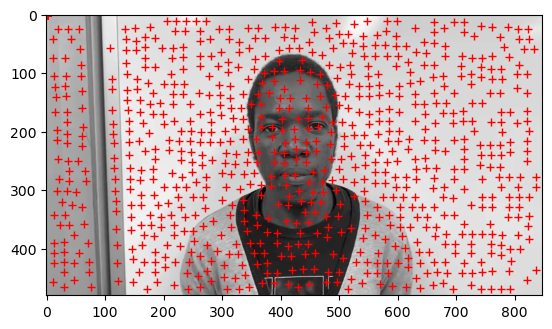

In [2]:
%matplotlib inline

frame0 = cv2.imread('DataAntony/frame000000.png',cv2.IMREAD_GRAYSCALE)

W_harris_patch = 10
harris_kappa = 0.06
W_nms = 16
N_keypoints = 1200

# compute harris_score
harris_score = mae6292.harris_corner(frame0, W_harris_patch, harris_kappa)

# select key points
keypoints = mae6292.select_keypoints(harris_score, N_keypoints, W_nms)

# Convert list to np.array and swap rows and columns
p = np.array(keypoints, dtype='float32').T # conver list to np.array
p = p[[1,0],:] # swap row and co

# Plotting
plt.figure(dpi=100)
plt.imshow(frame0, cmap='gray')
plt.plot(p[0,:], p[1,:], 'r+')

#Saving the image
plt.savefig('prob1a_my_pose.png')


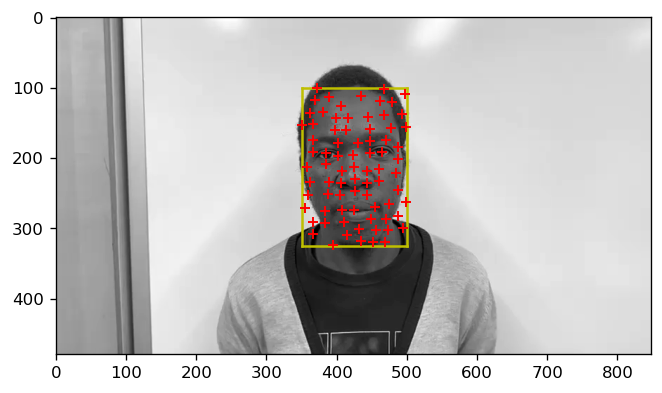

In [3]:
def rectangle(u0, v0, u1, v1):
    plt.plot([u0, u1],[v0, v0],'y')
    plt.plot([u0, u1],[v1, v1],'y')
    plt.plot([u0, u0],[v0, v1],'y')
    plt.plot([u1, u1],[v0, v1],'y')

# Rectangle size (values)    
u0, v0 = 350, 100
u1, v1 = 500, 325

# 2. Identify keypoints in the box

# empty container
p0_face = np.empty((2,0), dtype='float32')
# repeat for each keypoint
for i in range(p.shape[1]):
    ## YOUR CODE HERE:
    ## write if statement for the case that the i-th keypoint (p[0,i], p[1,i]) belongs to the box
    # Iterate through each keypoint
    if u0 <= p[0, i] <= u1 and v0 <= p[1, i] <= v1:
        p0_face = np.append(p0_face, p[:, i].reshape(2, 1), axis=1)
        p0_face = np.append(p0_face, p[:,i].reshape(2,1), axis=1)

# 3. Plot box and feaatures, adjust (u0,v0), (u1,v1) manually        
plt.figure(dpi=120)
plt.imshow(frame0, cmap='gray')
rectangle(u0,v0, u1,v1)
plt.plot(p0_face[0,:], p0_face[1,:], 'r+')

plt.savefig('prob1b_my_pose.png')


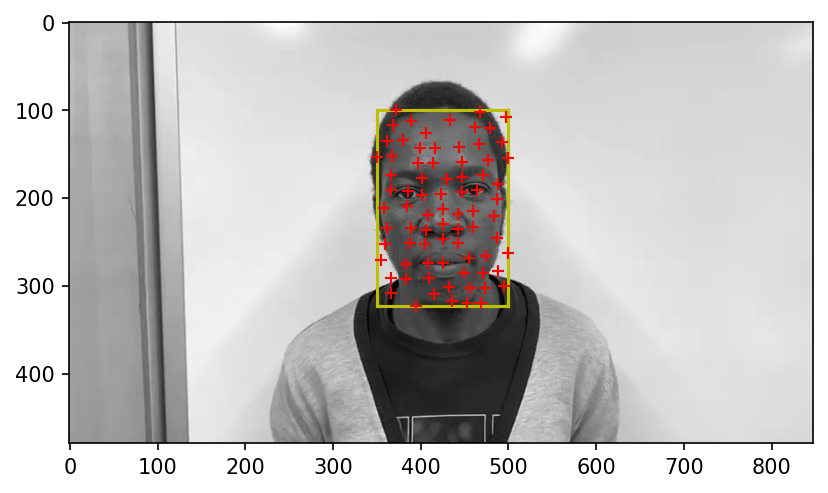

In [4]:
# Load frame1 and read it in grayscale
frame1 = cv2.imread('DataAntony/frame000001.png',cv2.IMREAD_GRAYSCALE)

# Track points from frame0 to frame1 using KLT algorithm
p1, index_track = mae6292.KLT(frame0, frame1, p0_face, W = 10, tol_bidir = 5, display = False)

# Filter points by index_track
p1_face = p1[:,index_track]

# Find the minimum and maximum coordinates to define the rectangle
u0 = np.amin(p1_face[0, :])  # Minimum x
v0 = np.amin(p1_face[1, :])  # Minimum y
u1 = np.amax(p1_face[0, :])  # Maximum x
v1 = np.amax(p1_face[1, :])  # Maximum y

# Plotting the frame and points
plt.figure(dpi=150)
plt.imshow(frame0, cmap='gray')
rectangle(u0,v0, u1,v1)

# Plot the points on the image
plt.plot(p1_face[0,:], p1_face[1,:], 'r+')

# Save the figure
plt.savefig('prob2a_my_pose.png')

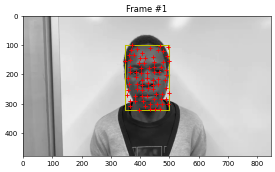

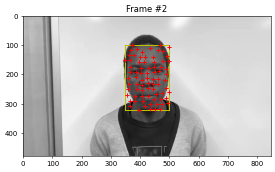

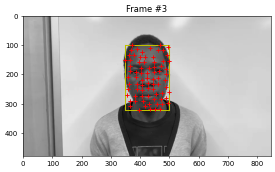

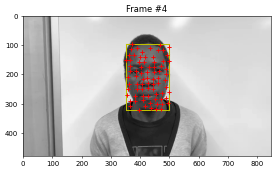

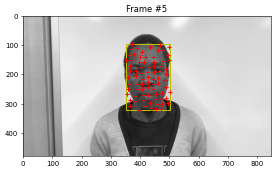

...

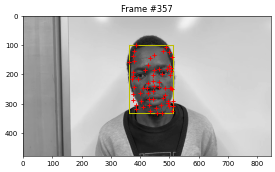

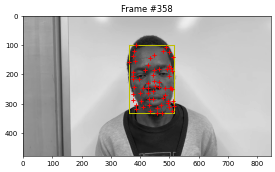

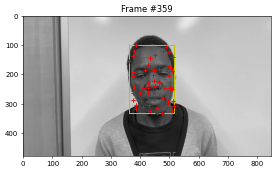

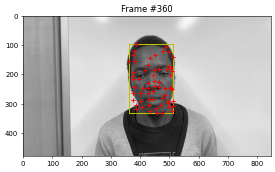

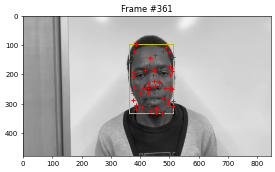

In [5]:
# draw figures within jupyter
%matplotlib inline

frame_pre = frame0
p_face_pre = p0_face
    
for i in range(1,362):
    frame = cv2.imread("DataAntony/frame{:06d}.png".format(i),cv2.IMREAD_GRAYSCALE)

    # Track `p_face_pre` from frame_pre to frame
    p_face, index_track = mae6292.KLT(frame_pre, frame, p_face_pre, W=7, tol_bidir=10, display=False)
    
    # Filter points by index_track
    p_face = p_face[:, index_track]  
    
    # choose (u0, v0), (u1, v1)
    if p_face.size > 0:
        u0 = np.amin(p_face[0, :])
        v0 = np.amin(p_face[1, :])
        u1 = np.amax(p_face[0, :])
        v1 = np.amax(p_face[1, :])
        
        # show results
        plt.figure(dpi=50)
        plt.imshow(frame, cmap='gray')
        rectangle(u0,v0, u1,v1)
        plt.plot(p_face[0,:], p_face[1,:], 'r+')
        p_face_pre = p_face
        frame_pre = frame
        
    # Saving the 99th frame
    if i == 99:
        # Set the title to include the frame number
        plt.title(f'Frame #{i}')
        
        # Save the frame as 'prob2b.png'
        plt.savefig('prob2b_my_pose.png')
        
        # Close the figure to free up memory
        plt.close()  
    else:
        # Set the title to include the frame number
        plt.title(f'Frame #{i}')  
        plt.show()
        
# Increment the frame counter after displaying each frame
i += 1 


In [8]:
# open a new window for plot
%matplotlib tk

# open a video file to read
video_read = cv2.VideoCapture('head-pose-face-detection-Munyaradzi-Antony.mp4')

# get frame size and fps (number of frames per second)
width = int(video_read.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(video_read.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = video_read.get(cv2.CAP_PROP_FPS)
size = (width, height)

# open a video file to save
codec = cv2.VideoWriter_fourcc(*'mp4v')
video_save = cv2.VideoWriter('prob3.mp4', codec, fps, size)

# to initiate the iteration, the first frame is saved to `frame_pre`
ret, frame_color = video_read.read() # color frame
frame_pre = cv2.cvtColor(frame_color, cv2.COLOR_BGR2GRAY) # grayscale frame
p_face_pre = p0_face # face features for the first frame

# repeat for each frame
for i in range(1,362):    

    # read a new frame
    ret, frame_color = video_read.read() # color frame
    print("frame number ", i)
    frame = cv2.cvtColor(frame_color, cv2.COLOR_BGR2GRAY) #grayscale frame
    if not ret:
        break
        
    frame = cv2.cvtColor(frame_color, cv2.COLOR_BGR2GRAY)  # grayscale frame
    
    # 1. Track p_face_pre from frame_pre to frame, save the tracked frame into p_face
    p_face, index_track = mae6292.KLT(frame_pre, frame, p_face_pre, W=7, tol_bidir=10, display=False)
    
    # Filter points by index_track
    p_face = p_face[:, index_track] 
    
     # 1. Sqaure values    
    u0, v0 = 350, 100
    u1, v1 = 500, 325
    
    # 2. Compute (u0,v0), (u1,v1) for the new bounding box using p_face
    if p_face.size > 0:
        u0 = np.amin(p_face[0, :])
        v0 = np.amin(p_face[1, :])
        u1 = np.amax(p_face[0, :])
        v1 = np.amax(p_face[1, :])
    
    # 3. Draw a rectangle on the color frame
    cv2.rectangle(frame_color, (int(u0),int(v0)), (int(u1),int(v1)), (0, 255,255))     
    
    # 4. current frame and features are saved into pre-frame and pre-feataures, for the next iteration
    frame_pre = frame
    p_face_pre = p_face
      
    # save the frame
    video_save.write(frame_color)

# release video files       
video_read.release()
video_save.release()
cv2.destroyAllWindows()


frame number  1
frame number  2
frame number  3
frame number  4
frame number  5
frame number  6
frame number  7
frame number  8
frame number  9
frame number  10
frame number  11
frame number  12
frame number  13
frame number  14
frame number  15
frame number  16
frame number  17
frame number  18
frame number  19
frame number  20
frame number  21
frame number  22
frame number  23
frame number  24
frame number  25
frame number  26
frame number  27
frame number  28
frame number  29
frame number  30
frame number  31
frame number  32
frame number  33
frame number  34
frame number  35
frame number  36
frame number  37
frame number  38
frame number  39
frame number  40
frame number  41
frame number  42
frame number  43
frame number  44
frame number  45
frame number  46
frame number  47
frame number  48
frame number  49
frame number  50
frame number  51
frame number  52
frame number  53
frame number  54
frame number  55
frame number  56
frame number  57
frame number  58
frame number  59
frame 

### How To Submit

Attach

1.  `prob1a.png`, `prob1b.png`
2.  `prob2a.png`, `prob2b.png`, `prob2c.mp4`
3.  `prob3.mp4`